In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="ticks", color_codes=True)
%matplotlib inline

project_dir = os.getcwd()
data_dir = os.path.join(project_dir, 'data')

In [2]:
import warnings
warnings.filterwarnings('ignore')

---
# Data Engineering

In [3]:
# Load the Dataset of Core Teams
core_teams_path = os.path.join(data_dir, 'Teams.csv')

df = pd.read_csv(core_teams_path)

In [4]:
# Get Salary Data for Teams
salaries_path = os.path.join(data_dir, 'Salaries.csv')
salaries = pd.read_csv(salaries_path)

# Aggregate by the Year and Team
salaries = salaries.groupby(['yearID', 'teamID']).agg({'salary':['sum']})
salaries.columns = ['salary']

# Merge Salaries with Team Info
df = pd.merge(df, salaries,  how='left', left_on=['yearID','teamID'], right_on = ['yearID','teamID'])


In [5]:
# Drop all Rows where the World Series winner is not recorded
df.dropna(axis=0, subset=['WSWin'], inplace=True)


In [6]:
# Drop Columns we're not interested in
columns_to_drop = ['yearID', 'teamID', 'divID', 'franchID', 'Rank', 'DivWin', 'WCWin', 'LgWin', 'name', 'park', 'attendance', 'teamIDBR', 'teamIDlahman45', 'teamIDretro']
df.drop(labels=columns_to_drop, axis=1, inplace=True)

In [7]:
# Set the Average for Null Entries
columns_to_average = ['GHome', 'DivWin', 'WcWin', 'SO', 'SB', 'CS', 'HBP', 'SF', 'salary']
# columns_to_average = ['GHome', 'DivWin', 'WcWin', 'SO', 'SB', 'CS', 'HBP', 'SF']
df.fillna(df.mean(), inplace=True)

In [8]:
def encode_onehot(_df, f):
    _df2 = pd.get_dummies(_df[f], prefix=f, prefix_sep='-')
    df3 = pd.concat([_df, _df2], axis=1)
    df3 = df3.drop([f], axis=1)
    return df3

# One-Hot encode needed columns
columns_to_encode = ['lgID']
for col in columns_to_encode:
    df = encode_onehot(df, col)


In [9]:
def convert_labels(row):
    if row['WSWin'] == 'N':
        row['WSWin'] = 0
    elif row['WSWin'] == 'Y':
        row['WSWin'] = 1
    return row

df = df.apply(convert_labels, axis=1)

In [10]:
# Generate Aggregate Features to support Visualizations

# Win Rate
df['WinRate'] = df['W']/(df['W'] + df['L'])

# On-Base Percentage
df['OBP'] = (df['H'] + df['BB'] + df['HBP']) / (df['AB'] + df['BB'] + df['HBP'] + df['SF'])

# Simple Batting Average
df['BA'] = df['H'] / df['AB']

# Slugging Percentage
df['1B'] = df['H'] - (df['2B'] + df['3B'] + df['HR'])
df['SLG'] = ( df['1B'] + (2*df['2B']) + (3*df['3B']) + (4*df['HR']) ) / df['AB']

# On-Base Plus Slugging
df['OPS'] = df['OBP'] + df['SLG']


In [11]:
# Write the Cleaned Data to a CSV
df.to_csv('teams.csv')

---
# Data Exploration 

In [12]:
# Prepare the input X matrix and target y vector
X = df.loc[:, df.columns != 'WSWin'].values
y = df.loc[:, df.columns == 'WSWin'].values.ravel()
features = [col for col in df.columns if col != 'WSWin']


In [13]:
winning_teams = df[df['WSWin'] == 1]
loosing_teams = df[df['WSWin'] == 0]

print(f"Num Winners: {len(winning_teams)}")
print(f"Num Loosers: {len(loosing_teams)}")
print(f"Percent Anomaly Class: {len(winning_teams)/(len(winning_teams)+len(loosing_teams))}")

Num Winners: 122
Num Loosers: 2506
Percent Anomaly Class: 0.04642313546423135


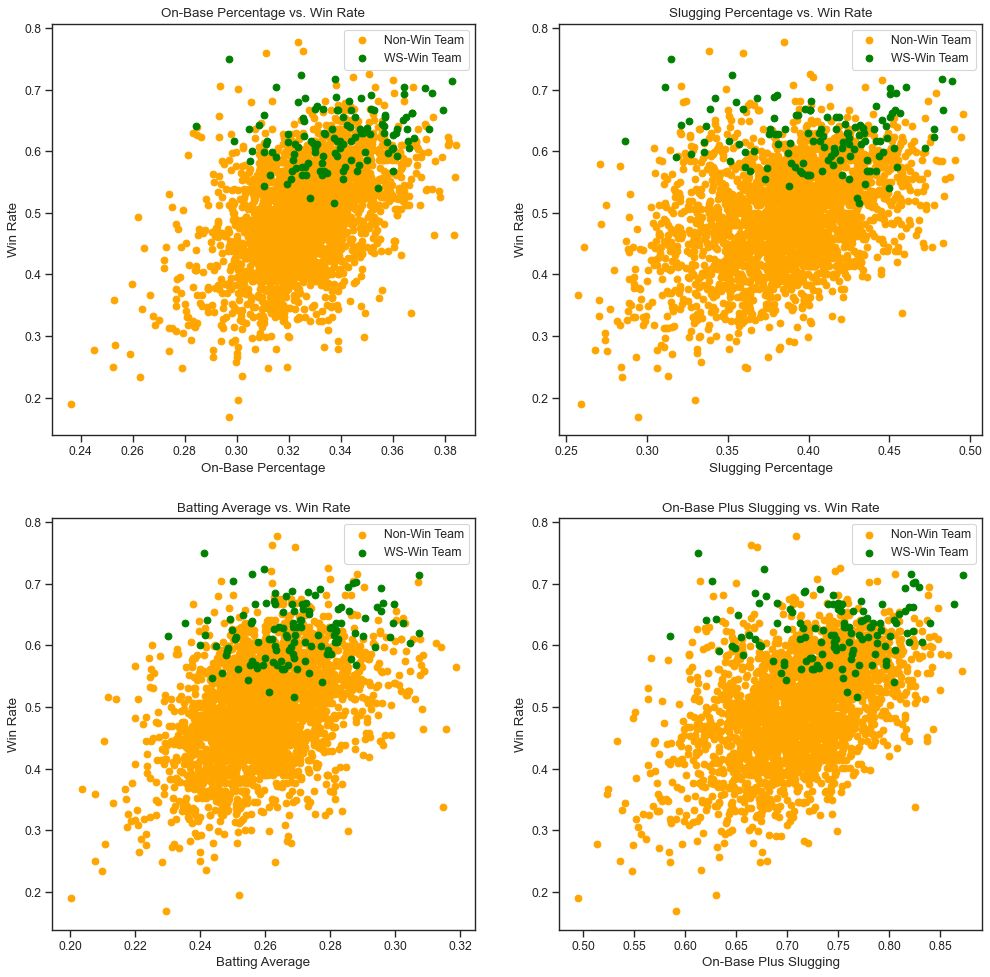

In [14]:
# Batting Statistics
f, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15), dpi=80)

# On-Base Percentage
axes[0][0].scatter(x=loosing_teams['OBP'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[0][0].scatter(x=winning_teams['OBP'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[0][0].title.set_text("On-Base Percentage vs. Win Rate")
axes[0][0].set_xlabel('On-Base Percentage')
axes[0][0].set_ylabel('Win Rate')
axes[0][0].legend()

# Slugging Percentage
axes[0][1].scatter(x=loosing_teams['SLG'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[0][1].scatter(x=winning_teams['SLG'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[0][1].title.set_text("Slugging Percentage vs. Win Rate")
axes[0][1].set_xlabel('Slugging Percentage')
axes[0][1].set_ylabel('Win Rate')
axes[0][1].legend()

# Batting Average
axes[1][0].scatter(x=loosing_teams['BA'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[1][0].scatter(x=winning_teams['BA'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[1][0].title.set_text("Batting Average vs. Win Rate")
axes[1][0].set_xlabel('Batting Average')
axes[1][0].set_ylabel('Win Rate')
axes[1][0].legend()

# On-Base Plus Slugging
axes[1][1].scatter(x=loosing_teams['OPS'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[1][1].scatter(x=winning_teams['OPS'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[1][1].title.set_text("On-Base Plus Slugging vs. Win Rate")
axes[1][1].set_xlabel('On-Base Plus Slugging')
axes[1][1].set_ylabel('Win Rate')
axes[1][1].legend()

plt.show()

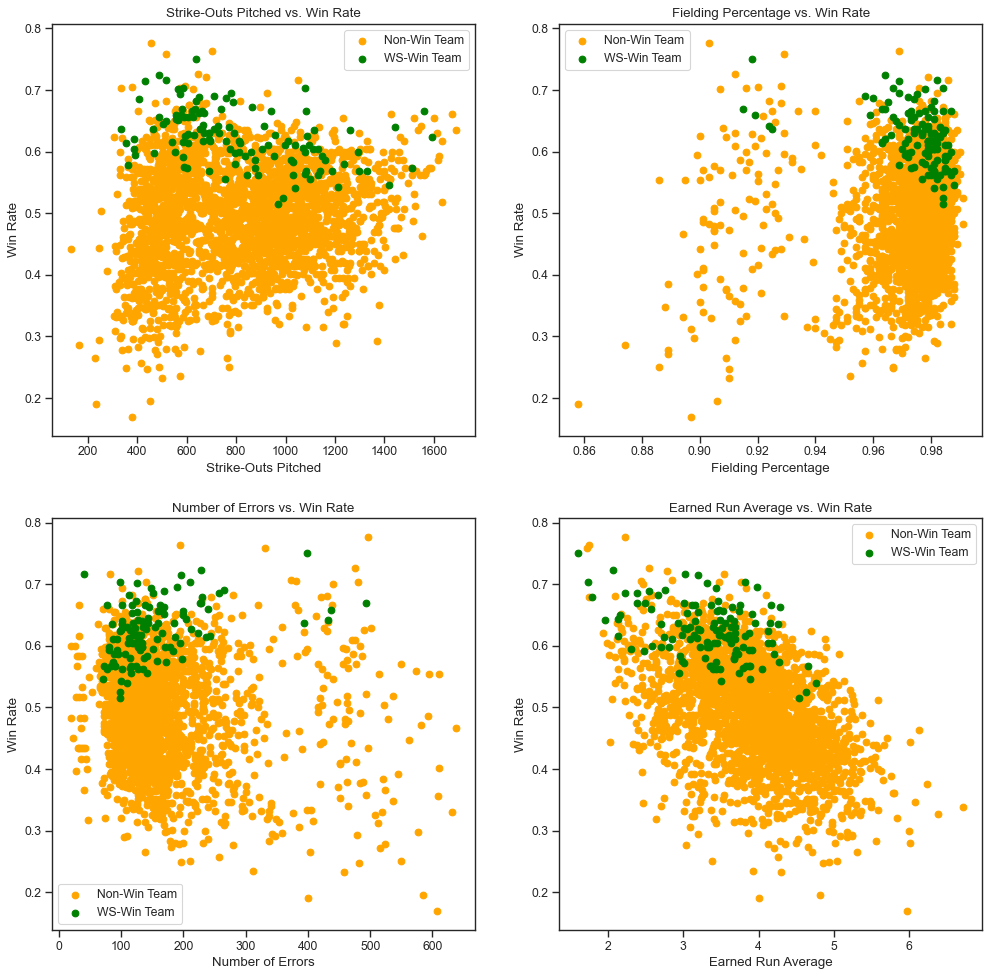

In [15]:
# Defensive Statistics
f, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15), dpi=80)

# Strike Outs Pitched
axes[0][0].scatter(x=loosing_teams['SOA'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[0][0].scatter(x=winning_teams['SOA'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[0][0].title.set_text("Strike-Outs Pitched vs. Win Rate")
axes[0][0].set_xlabel('Strike-Outs Pitched')
axes[0][0].set_ylabel('Win Rate')
axes[0][0].legend()

# Fielding Percentage
axes[0][1].scatter(x=loosing_teams['FP'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[0][1].scatter(x=winning_teams['FP'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[0][1].title.set_text("Fielding Percentage vs. Win Rate")
axes[0][1].set_xlabel('Fielding Percentage')
axes[0][1].set_ylabel('Win Rate')

axes[0][1].legend()

# Number of Errors
axes[1][0].scatter(x=loosing_teams['E'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[1][0].scatter(x=winning_teams['E'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[1][0].title.set_text("Number of Errors vs. Win Rate")
axes[1][0].set_xlabel('Number of Errors')
axes[1][0].set_ylabel('Win Rate')
axes[1][0].legend()

# Earned-Run Average
axes[1][1].scatter(x=loosing_teams['ERA'], y=loosing_teams['WinRate'], c='orange', label='Non-Win Team')
axes[1][1].scatter(x=winning_teams['ERA'], y=winning_teams['WinRate'], c='green', label='WS-Win Team')
axes[1][1].title.set_text("Earned Run Average vs. Win Rate")
axes[1][1].set_xlabel('Earned Run Average')
axes[1][1].set_ylabel('Win Rate')
axes[1][1].legend()

plt.show()

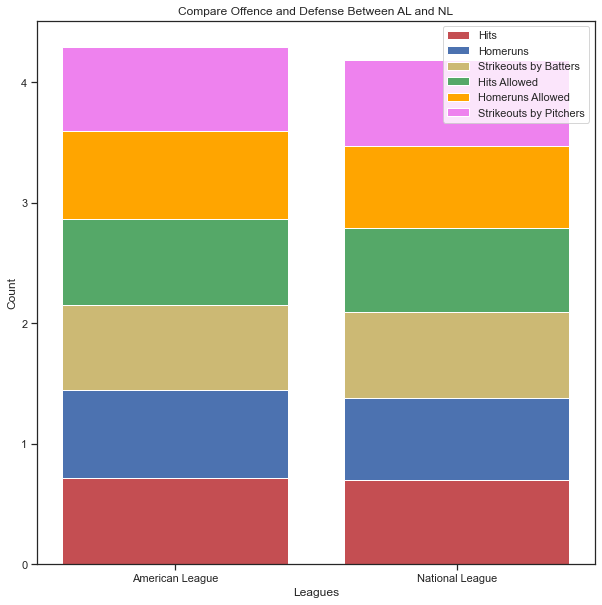

In [16]:
# Compare American League and National League Teams
al_teams = df[df['lgID-AL'] == 1]
nal = len(al_teams)
nl_teams = df[df['lgID-NL'] == 1]
nnl = len(nl_teams)

x = ['American League', 'National League']
y1 = np.array([ al_teams['H'].sum()/nal, nl_teams['H'].sum()/nnl ] )        # Hits
y1_norm = np.linalg.norm(y1)
y1 = y1/y1_norm

y2 = np.array([ al_teams['HR'].sum()/nal, nl_teams['HR'].sum()/nnl ])       # Homeruns
y2_norm = np.linalg.norm(y2)
y2 = y2/y2_norm

y3 = np.array([ al_teams['SO'].sum()/nal, nl_teams['SO'].sum()/nnl ])       # Strikeouts by Batters
y3_norm = np.linalg.norm(y3)
y3 = y3/y3_norm

y4 = np.array([ al_teams['HA'].sum()/nal, nl_teams['HA'].sum()/nnl ])       # Hits Allowed
y4_norm = np.linalg.norm(y4)
y4 = y4/y4_norm

y5 = np.array([ al_teams['HRA'].sum()/nal, nl_teams['HRA'].sum()/nnl ])     # Homeruns Allowed
y5_norm = np.linalg.norm(y5)
y5 = y5/y5_norm

y6 = np.array([ al_teams['SOA'].sum()/nal, nl_teams['SOA'].sum()/nnl ])     # Strikeouts by Pitchers
y6_norm = np.linalg.norm(y6)
y6 = y6/y6_norm

# plot bars in stack manner
plt.figure(figsize=(10,10))
plt.bar(x, y1, color='r')
plt.bar(x, y2, bottom=y1, color='b')
plt.bar(x, y3, bottom=y1+y2, color='y')
plt.bar(x, y4, bottom=y1+y2+y3, color='g')
plt.bar(x, y5, bottom=y1+y2+y3+y4, color='orange')
plt.bar(x, y6, bottom=y1+y2+y3+y4+y5, color='violet')
plt.xlabel("Leagues")
plt.ylabel("Count")
plt.legend(["Hits", "Homeruns", "Strikeouts by Batters", "Hits Allowed", "Homeruns Allowed", "Strikeouts by Pitchers"])
plt.title("Compare Offence and Defense Between AL and NL")
plt.show()


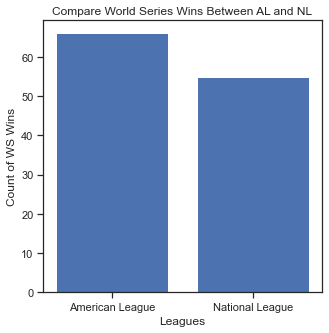

In [17]:
# Plot Number of AL and NL Worl Series

x = ['American League', 'National League']
y1 = np.array([ al_teams['WSWin'].sum(), nl_teams['WSWin'].sum() ] ) 

# plot bars in stack manner
plt.figure(figsize=(5,5))
plt.bar(x, y1)
plt.xlabel("Leagues")
plt.ylabel("Count of WS Wins")
plt.title("Compare World Series Wins Between AL and NL")
plt.show()

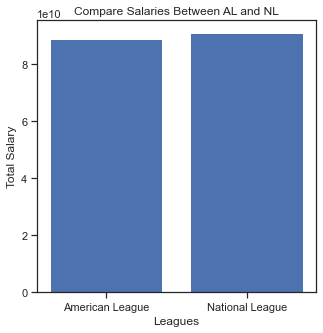

In [18]:
# Plot Number of AL and NL Worl Seroies

x = ['American League', 'National League']
y1 = np.array([ al_teams['salary'].sum(), nl_teams['salary'].sum() ] )        # Hits

# plot bars in stack manner
plt.figure(figsize=(5,5))
plt.bar(x, y1)
plt.xlabel("Leagues")
plt.ylabel("Total Salary")
plt.title("Compare Salaries Between AL and NL")
plt.show()

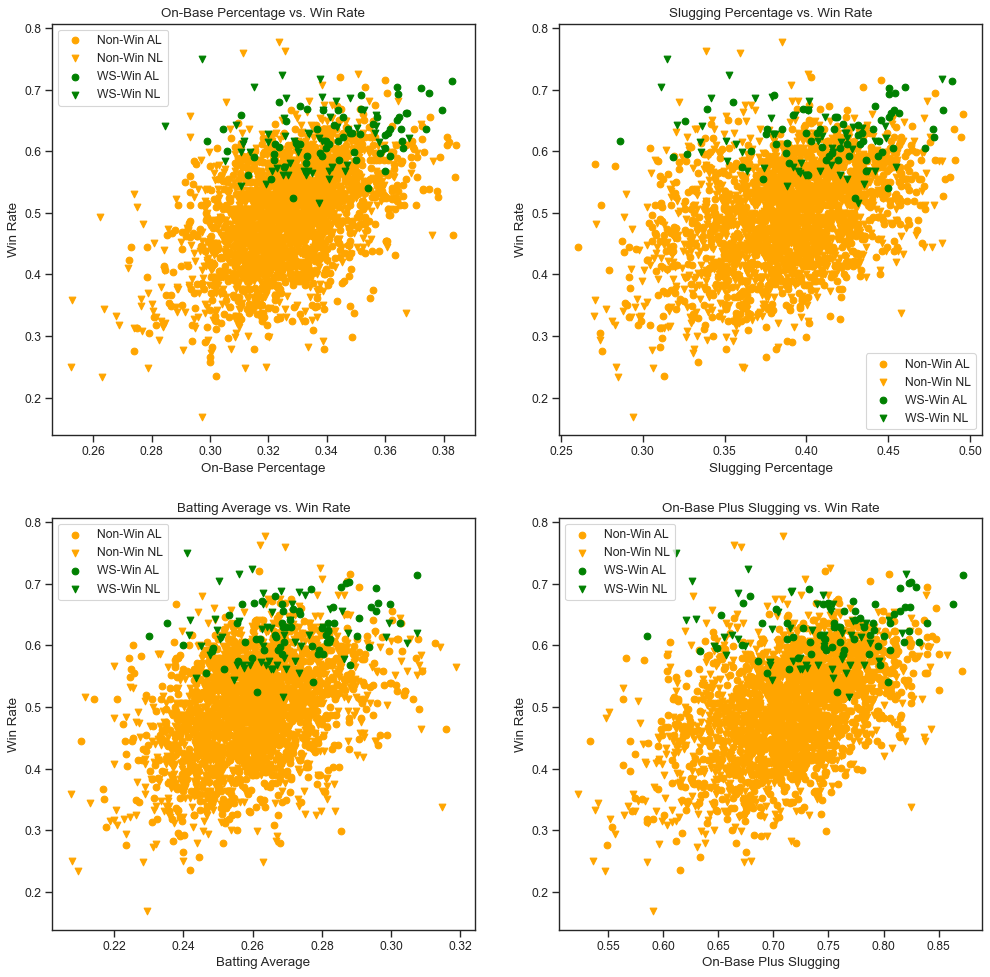

In [19]:
# Compare Statistics for AL and NL Teams
# Compare American League and National League Teams
al_winners = al_teams[al_teams['WSWin'] == 1]
al_loosers = al_teams[al_teams['WSWin'] == 0]
nl_winners = nl_teams[nl_teams['WSWin'] == 1]
nl_loosers = nl_teams[nl_teams['WSWin'] == 0]

# Batting Statistics
f, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15), dpi=80)

# On-Base Percentage
axes[0][0].scatter(x=al_loosers['OBP'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[0][0].scatter(x=nl_loosers['OBP'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[0][0].scatter(x=al_winners['OBP'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[0][0].scatter(x=nl_winners['OBP'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[0][0].title.set_text("On-Base Percentage vs. Win Rate")
axes[0][0].set_xlabel('On-Base Percentage')
axes[0][0].set_ylabel('Win Rate')
axes[0][0].legend()

# Slugging Percentage
axes[0][1].scatter(x=al_loosers['SLG'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[0][1].scatter(x=nl_loosers['SLG'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[0][1].scatter(x=al_winners['SLG'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[0][1].scatter(x=nl_winners['SLG'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[0][1].title.set_text("Slugging Percentage vs. Win Rate")
axes[0][1].set_xlabel('Slugging Percentage')
axes[0][1].set_ylabel('Win Rate')
axes[0][1].legend()

# Batting Average
axes[1][0].scatter(x=al_loosers['BA'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[1][0].scatter(x=nl_loosers['BA'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[1][0].scatter(x=al_winners['BA'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[1][0].scatter(x=nl_winners['BA'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[1][0].title.set_text("Batting Average vs. Win Rate")
axes[1][0].set_xlabel('Batting Average')
axes[1][0].set_ylabel('Win Rate')
axes[1][0].legend()

# On-Base Plus Slugging
axes[1][1].scatter(x=al_loosers['OPS'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[1][1].scatter(x=nl_loosers['OPS'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[1][1].scatter(x=al_winners['OPS'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[1][1].scatter(x=nl_winners['OPS'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[1][1].title.set_text("On-Base Plus Slugging vs. Win Rate")
axes[1][1].set_xlabel('On-Base Plus Slugging')
axes[1][1].set_ylabel('Win Rate')
axes[1][1].legend()

plt.show()

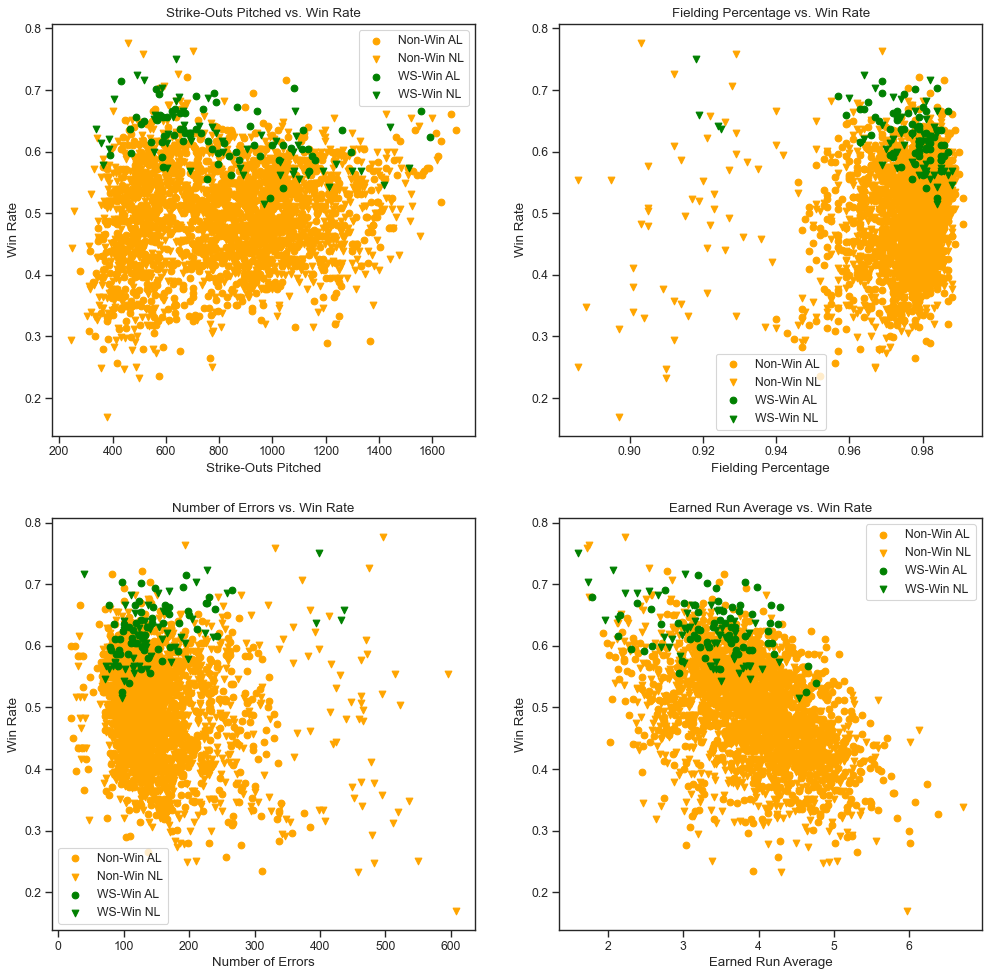

In [20]:
# Defensive Statistics
f, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15), dpi=80)

# Strike Outs Pitched
axes[0][0].scatter(x=al_loosers['SOA'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[0][0].scatter(x=nl_loosers['SOA'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[0][0].scatter(x=al_winners['SOA'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[0][0].scatter(x=nl_winners['SOA'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[0][0].title.set_text("Strike-Outs Pitched vs. Win Rate")
axes[0][0].set_xlabel('Strike-Outs Pitched')
axes[0][0].set_ylabel('Win Rate')
axes[0][0].legend()

# Fielding Percentage
axes[0][1].scatter(x=al_loosers['FP'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[0][1].scatter(x=nl_loosers['FP'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[0][1].scatter(x=al_winners['FP'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[0][1].scatter(x=nl_winners['FP'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[0][1].title.set_text("Fielding Percentage vs. Win Rate")
axes[0][1].set_xlabel('Fielding Percentage')
axes[0][1].set_ylabel('Win Rate')

axes[0][1].legend()

# Number of Errors
axes[1][0].scatter(x=al_loosers['E'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[1][0].scatter(x=nl_loosers['E'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[1][0].scatter(x=al_winners['E'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[1][0].scatter(x=nl_winners['E'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[1][0].title.set_text("Number of Errors vs. Win Rate")
axes[1][0].set_xlabel('Number of Errors')
axes[1][0].set_ylabel('Win Rate')
axes[1][0].legend()

# Earned-Run Average
axes[1][1].scatter(x=al_loosers['ERA'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[1][1].scatter(x=nl_loosers['ERA'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[1][1].scatter(x=al_winners['ERA'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[1][1].scatter(x=nl_winners['ERA'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[1][1].title.set_text("Earned Run Average vs. Win Rate")
axes[1][1].set_xlabel('Earned Run Average')
axes[1][1].set_ylabel('Win Rate')
axes[1][1].legend()

plt.show()

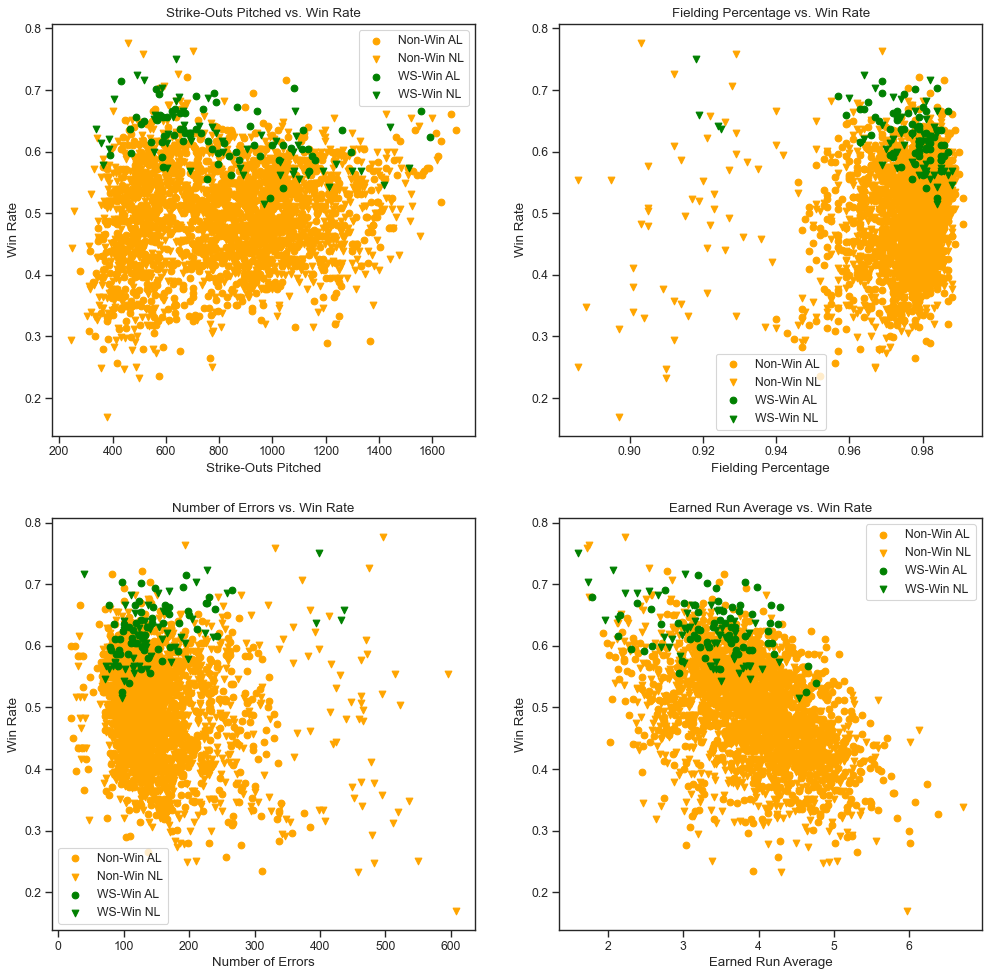

In [21]:
# Defensive Statistics
f, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15), dpi=80)

# Strike Outs Pitched
axes[0][0].scatter(x=al_loosers['SOA'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[0][0].scatter(x=nl_loosers['SOA'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[0][0].scatter(x=al_winners['SOA'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[0][0].scatter(x=nl_winners['SOA'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[0][0].title.set_text("Strike-Outs Pitched vs. Win Rate")
axes[0][0].set_xlabel('Strike-Outs Pitched')
axes[0][0].set_ylabel('Win Rate')
axes[0][0].legend()

# Fielding Percentage
axes[0][1].scatter(x=al_loosers['FP'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[0][1].scatter(x=nl_loosers['FP'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[0][1].scatter(x=al_winners['FP'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[0][1].scatter(x=nl_winners['FP'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[0][1].title.set_text("Fielding Percentage vs. Win Rate")
axes[0][1].set_xlabel('Fielding Percentage')
axes[0][1].set_ylabel('Win Rate')
axes[0][1].legend()

# Number of Errors
axes[1][0].scatter(x=al_loosers['E'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[1][0].scatter(x=nl_loosers['E'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[1][0].scatter(x=al_winners['E'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[1][0].scatter(x=nl_winners['E'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[1][0].title.set_text("Number of Errors vs. Win Rate")
axes[1][0].set_xlabel('Number of Errors')
axes[1][0].set_ylabel('Win Rate')
axes[1][0].legend()

# Earned-Run Average
axes[1][1].scatter(x=al_loosers['ERA'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes[1][1].scatter(x=nl_loosers['ERA'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes[1][1].scatter(x=al_winners['ERA'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes[1][1].scatter(x=nl_winners['ERA'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes[1][1].title.set_text("Earned Run Average vs. Win Rate")
axes[1][1].set_xlabel('Earned Run Average')
axes[1][1].set_ylabel('Win Rate')
axes[1][1].legend()

plt.show()

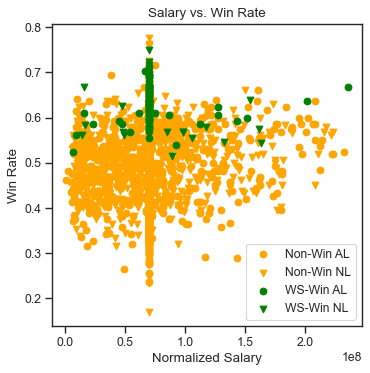

In [22]:
# Salary Statistics
f, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5), dpi=80)

# On-Base Percentage
axes.scatter(x=al_loosers['salary'], y=al_loosers['WinRate'], c='orange', marker='o', label='Non-Win AL')
axes.scatter(x=nl_loosers['salary'], y=nl_loosers['WinRate'], c='orange', marker='v', label='Non-Win NL')
axes.scatter(x=al_winners['salary'], y=al_winners['WinRate'], c='green', marker='o', label='WS-Win AL')
axes.scatter(x=nl_winners['salary'], y=nl_winners['WinRate'], c='green', marker='v', label='WS-Win NL')
axes.title.set_text("Salary vs. Win Rate")
axes.set_xlabel('Normalized Salary')
axes.set_ylabel('Win Rate')
axes.legend()

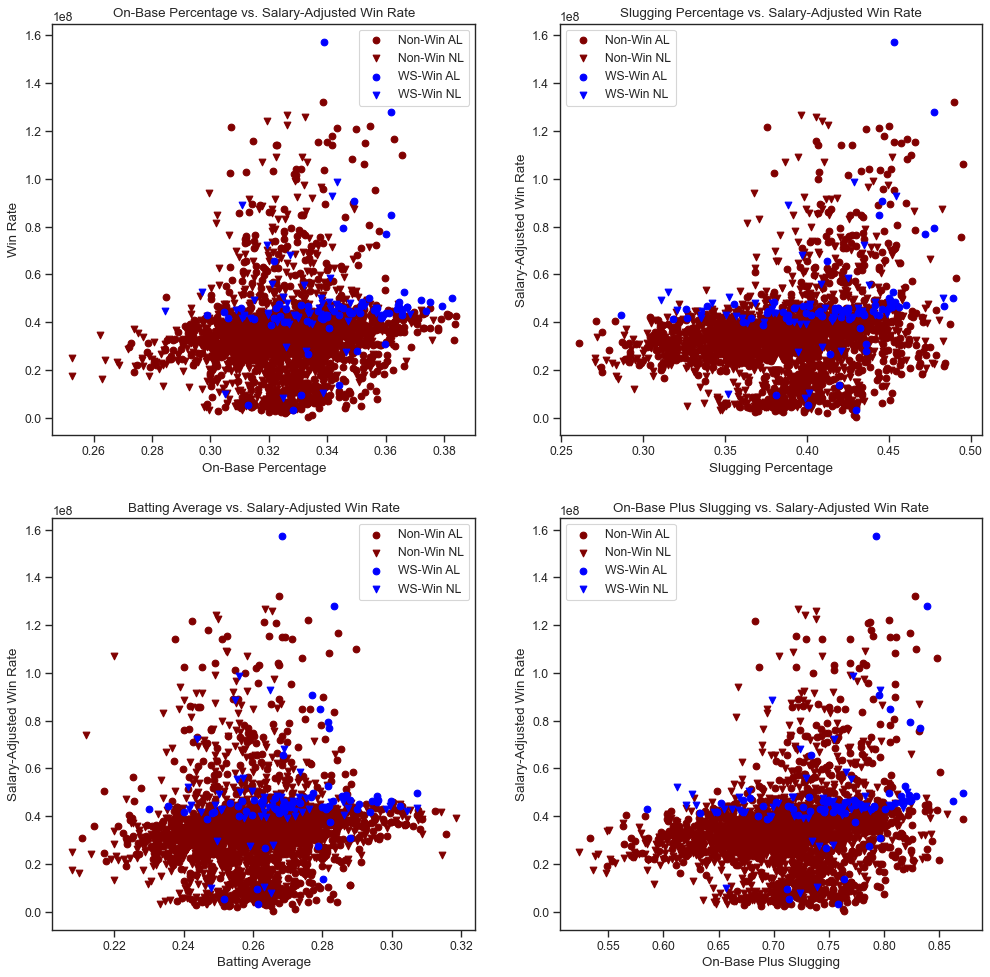

In [23]:
# Compare Statistics for AL and NL Teams
# Normalize by Team Salary

# Batting Statistics
f, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15), dpi=80)

# On-Base Percentage
axes[0][0].scatter(x=al_loosers['OBP'], y=(al_loosers['WinRate']*al_loosers['salary']), c='maroon', marker='o', label='Non-Win AL')
axes[0][0].scatter(x=nl_loosers['OBP'], y=(nl_loosers['WinRate']*nl_loosers['salary']), c='maroon', marker='v', label='Non-Win NL')
axes[0][0].scatter(x=al_winners['OBP'], y=(al_winners['WinRate']*al_winners['salary']), c='blue', marker='o', label='WS-Win AL')
axes[0][0].scatter(x=nl_winners['OBP'], y=(nl_winners['WinRate']*nl_winners['salary']), c='blue', marker='v', label='WS-Win NL')
axes[0][0].title.set_text("On-Base Percentage vs. Salary-Adjusted Win Rate")
axes[0][0].set_xlabel('On-Base Percentage')
axes[0][0].set_ylabel('Win Rate')
axes[0][0].legend()

# Slugging Percentage
axes[0][1].scatter(x=al_loosers['SLG'], y=al_loosers['WinRate']*al_loosers['salary'], c='maroon', marker='o', label='Non-Win AL')
axes[0][1].scatter(x=nl_loosers['SLG'], y=nl_loosers['WinRate']*nl_loosers['salary'], c='maroon', marker='v', label='Non-Win NL')
axes[0][1].scatter(x=al_winners['SLG'], y=al_winners['WinRate']*al_winners['salary'], c='blue', marker='o', label='WS-Win AL')
axes[0][1].scatter(x=nl_winners['SLG'], y=nl_winners['WinRate']*nl_winners['salary'], c='blue', marker='v', label='WS-Win NL')
axes[0][1].title.set_text("Slugging Percentage vs. Salary-Adjusted Win Rate")
axes[0][1].set_xlabel('Slugging Percentage')
axes[0][1].set_ylabel('Salary-Adjusted Win Rate')
axes[0][1].legend()

# Batting Average
axes[1][0].scatter(x=al_loosers['BA'], y=al_loosers['WinRate']*al_loosers['salary'], c='maroon', marker='o', label='Non-Win AL')
axes[1][0].scatter(x=nl_loosers['BA'], y=nl_loosers['WinRate']*nl_loosers['salary'], c='maroon', marker='v', label='Non-Win NL')
axes[1][0].scatter(x=al_winners['BA'], y=al_winners['WinRate']*al_winners['salary'], c='blue', marker='o', label='WS-Win AL')
axes[1][0].scatter(x=nl_winners['BA'], y=nl_winners['WinRate']*nl_winners['salary'], c='blue', marker='v', label='WS-Win NL')
axes[1][0].title.set_text("Batting Average vs. Salary-Adjusted Win Rate")
axes[1][0].set_xlabel('Batting Average')
axes[1][0].set_ylabel('Salary-Adjusted Win Rate')
axes[1][0].legend()

# On-Base Plus Slugging
axes[1][1].scatter(x=al_loosers['OPS'], y=al_loosers['WinRate']*al_loosers['salary'], c='maroon', marker='o', label='Non-Win AL')
axes[1][1].scatter(x=nl_loosers['OPS'], y=nl_loosers['WinRate']*nl_loosers['salary'], c='maroon', marker='v', label='Non-Win NL')
axes[1][1].scatter(x=al_winners['OPS'], y=al_winners['WinRate']*al_winners['salary'], c='blue', marker='o', label='WS-Win AL')
axes[1][1].scatter(x=nl_winners['OPS'], y=nl_winners['WinRate']*nl_winners['salary'], c='blue', marker='v', label='WS-Win NL')
axes[1][1].title.set_text("On-Base Plus Slugging vs. Salary-Adjusted Win Rate")
axes[1][1].set_xlabel('On-Base Plus Slugging')
axes[1][1].set_ylabel('Salary-Adjusted Win Rate')
axes[1][1].legend()

plt.show()

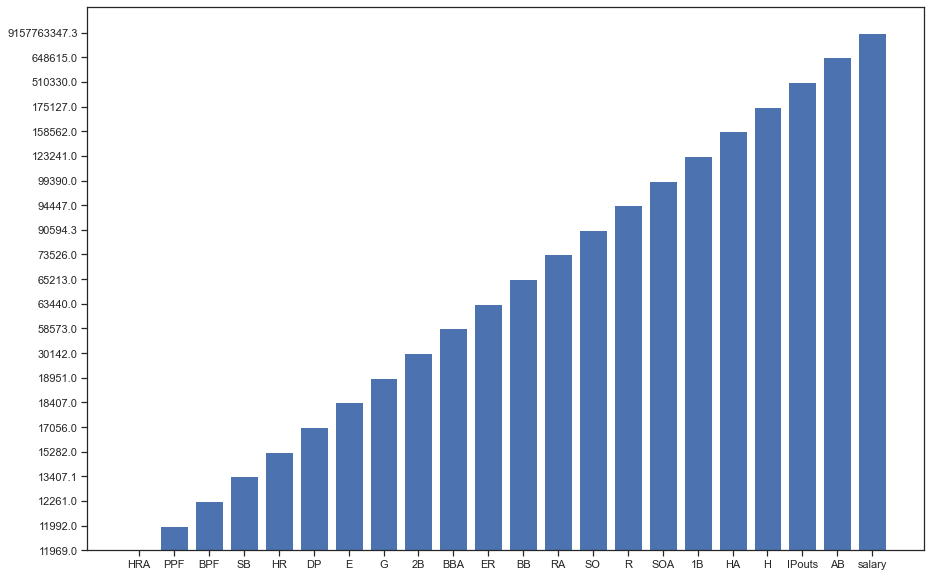

In [24]:
# Direct correlation between each column of X and the target y
corrs = np.absolute([np.correlate(X[:,j], y)[0] for j in range(X.shape[1])])

# Reverse sort, numpy array negation reverses the order
ranks = np.argsort((corrs))

# Display top-9 and bot-5
rankings = np.array([(f'{corrs[j]:.1f}', features[j]) for j in ranks])

# Plot the Rankings based on Correlations
show_top_cors = 20
plt.figure(figsize=(15,10))
plt.bar(rankings[show_top_cors:,1], rankings[show_top_cors:,0])
plt.title()
plt.show()

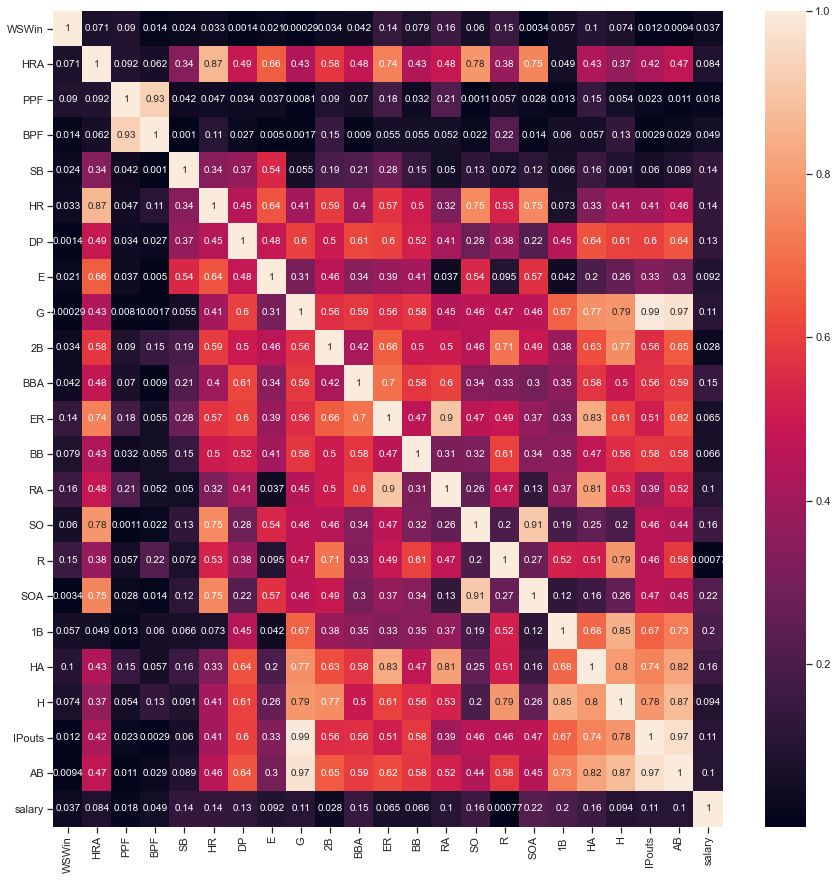

In [25]:
top_features = ['WSWin'] + rankings[show_top_cors:,1].tolist()

# Correlations 
corr = np.absolute(df[top_features].corr())

plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, xticklabels=top_features, yticklabels=top_features)
plt.show()

---
# Classification 

In [26]:
# Normalize all the Columns in the Dataframe
# This imrpoves accuracy by ensuing an equal scale/importance of each feature
def min_max_scaling(series):
    return (series - series.min()) / (series.max() - series.min())

for col in df.columns:
    df[col] = min_max_scaling(df[col])

In [27]:
# Prepare the input X matrix and target y vector
X = df.loc[:, df.columns != 'WSWin']
y = df.loc[:, df.columns == 'WSWin']

features = [col for col in df.columns if col != 'WSWin']
print(f'X Shape: {X.shape}')
print(f'y Shape: {y.shape}')

X Shape: (2628, 42)
y Shape: (2628, 1)


In [28]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
import sklearn.metrics as metrics
import seaborn as sns
import shap
shap.initjs()

common_metrics = [
    metrics.accuracy_score,
    metrics.balanced_accuracy_score,
    metrics.precision_score,
    metrics.recall_score,
    metrics.f1_score,
    metrics.matthews_corrcoef,
    metrics.confusion_matrix
]

# Set Number of Folds for Validation
num_folds = 2
num_iters = 10

In [29]:
def evaluate_kfold(_X, _y, model, folds, iterations):

    # Initialize Metrics
    evaluation_results = {}
    for metric_function in common_metrics:
        evaluation_results[metric_function.__name__] = []

    # Loop for N iterations
    for _ in range(iterations):
        # Create the Models for Comparison
        pipe = make_pipeline(MinMaxScaler(), model)

        # Set up Validation
        kf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=1)
        for train, test in kf.split(_X, _y):
            # Fit them to the Split Data
            pipe.fit(_X.iloc[train], _y.iloc[train])
            # Make Predictions on Each Model
            pred = pipe.predict(_X.iloc[test])

            # Calculate the Metrics
            for metric_function in common_metrics:
                score = metric_function(_y.iloc[test], pred)
                evaluation_results[metric_function.__name__].append(score)

    # Compile Reults from each iteration into an Aggregate Metric
    for metric_function in common_metrics:
        evaluation_results[metric_function.__name__] = np.average(evaluation_results[metric_function.__name__], axis=0)

    return evaluation_results

In [30]:
def plot_confusion_matrix(cm, title):
    # Plot Confusion Matrix
    cm = evaluation_results['confusion_matrix']
    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    ax = sns.heatmap(cmn, annot=True, cmap='Blues')
    ax.set_title(f'{title} Confusion Matrix\n\n')
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ')

    ## Ticket labels - List must be in alphabetical order
    ax.xaxis.set_ticklabels(['False','True'])
    ax.yaxis.set_ticklabels(['False','True'])

    ## Display the visualization of the Confusion Matrix.
    plt.show()

## Support Vector Machine - Kernel Based Classification

total #results=10
Stratified 2-fold cross validation Metrics:  {'accuracy_score': 0.8295281582952816, 'balanced_accuracy_score': 0.8092446979707718, 'precision_score': 0.18599055475848875, 'recall_score': 0.7868852459016393, 'f1_score': 0.3007502616623138, 'matthews_corrcoef': 0.3276662596636952, 'confusion_matrix': array([[1042.,  211.],
       [  13.,   48.]])}


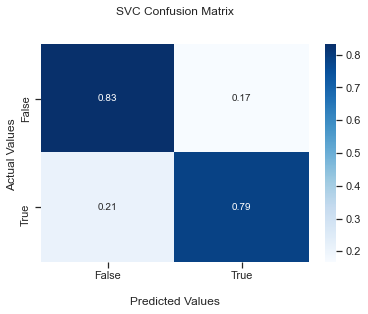

CPU times: user 10.7 s, sys: 121 ms, total: 10.8 s
Wall time: 11 s


In [31]:
%%time
from sklearn.svm import SVC

# Evaluate
model = SVC(probability=True, class_weight='balanced')
evaluation_results = evaluate_kfold(X, y, model=model, folds=num_folds, iterations=num_iters)
print(f'total #results={num_iters}')
print(f'Stratified {num_folds}-fold cross validation Metrics:  {evaluation_results}')

# Plot Confusion Matrix
plot_confusion_matrix(cm=evaluation_results['confusion_matrix'], title='SVC')


100%|██████████| 100/100 [37:19<00:00, 22.40s/it]


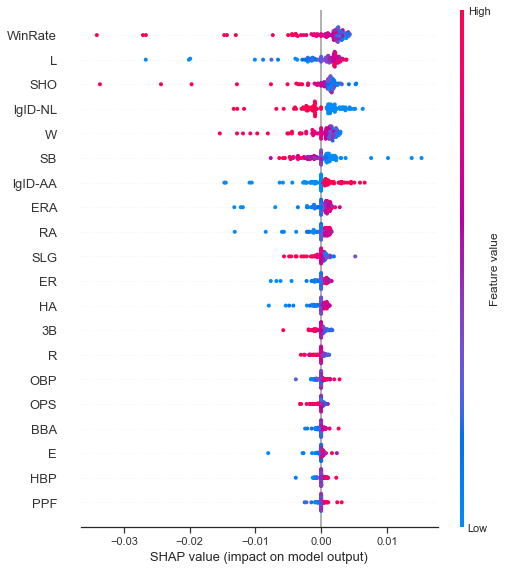

In [32]:
num_explanations = 100
# Plot Feature Relevance for top features
explainer = shap.KernelExplainer(model.predict_proba, X[:num_explanations])
shap_values = explainer.shap_values(X[:num_explanations])

shap.summary_plot(shap_values[0], X[:num_explanations])

In [33]:
shap.initjs()

# Plot Feature Interactions 
shap.force_plot(explainer.expected_value[0], shap_values[0], X)

## Logistic Regression - Linnear Model

total #results=10
Stratified 2-fold cross validation Metrics:  {'accuracy_score': 0.8302891933028921, 'balanced_accuracy_score': 0.8408344563212224, 'precision_score': 0.1955559953072215, 'recall_score': 0.8524590163934427, 'f1_score': 0.3181257014590348, 'matthews_corrcoef': 0.35699615050974803, 'confusion_matrix': array([[1039.,  214.],
       [   9.,   52.]])}


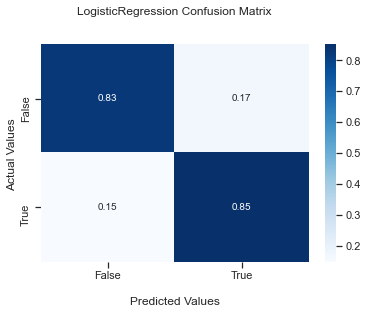

CPU times: user 4.89 s, sys: 173 ms, total: 5.06 s
Wall time: 1.57 s


In [34]:
%%time
from sklearn.linear_model import LogisticRegression

# Evaluate
model = LogisticRegression(class_weight='balanced')

evaluation_results = evaluate_kfold(X, y, model=model, folds=num_folds, iterations=num_iters)
print(f'total #results={num_iters}')
print(f'Stratified {num_folds}-fold cross validation Metrics:  {evaluation_results}')

# Plot Confusion Matrix
plot_confusion_matrix(cm=evaluation_results['confusion_matrix'], title='LogisticRegression')


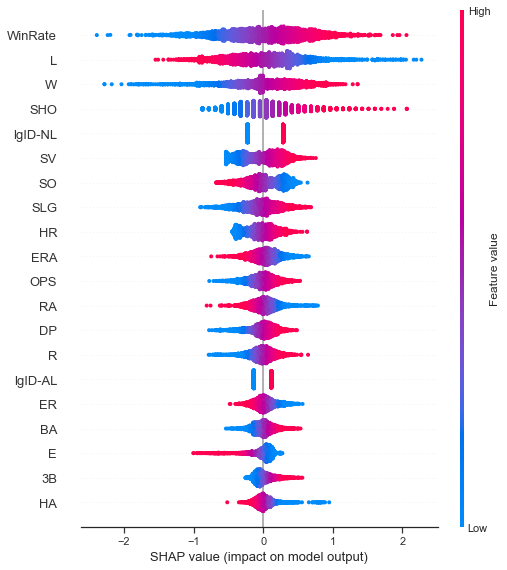

In [35]:
# Plot Feature Relevance for top features
explainer = shap.LinearExplainer(model, X)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X)

In [36]:
shap.initjs()

# Plot Feature Interactions 
shap.force_plot(explainer.expected_value, shap_values, X)

In [37]:
shap.initjs()

ind = -1
shap.force_plot(
    explainer.expected_value, shap_values[ind], X.iloc[ind],
    feature_names=features
)

## Decision Tree Classifier - Tree Based Learning

total #results=10
Stratified 2-fold cross validation Metrics:  {'accuracy_score': 0.9271689497716894, 'balanced_accuracy_score': 0.5820646841024165, 'precision_score': 0.2073695266133543, 'recall_score': 0.20163934426229507, 'f1_score': 0.20411856073801643, 'matthews_corrcoef': 0.1661995306595579, 'confusion_matrix': array([[1206. ,   47. ],
       [  48.7,   12.3]])}


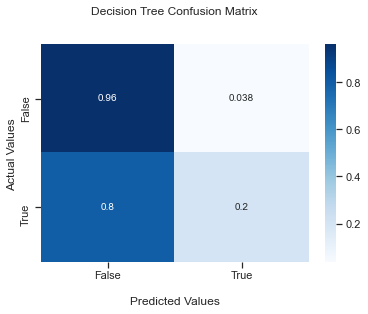

CPU times: user 781 ms, sys: 12.3 ms, total: 793 ms
Wall time: 792 ms


In [38]:
%%time
from sklearn.tree import DecisionTreeClassifier

# Evaluate
model = DecisionTreeClassifier()
evaluation_results = evaluate_kfold(X, y, model=model, folds=num_folds, iterations=num_iters)
print(f'total #results={num_iters}')
print(f'Stratified {num_folds}-fold cross validation Metrics:  {evaluation_results}')

# Plot Confusion Matrix
plot_confusion_matrix(cm=evaluation_results['confusion_matrix'], title='Decision Tree')


[Text(1175.491111526946, 2140.4249999999997, 'WinRate <= 0.793\ngini = 0.089\nsamples = 1314\nvalue = [1253, 61]'),
 Text(640.401758982036, 1981.8749999999998, 'PPF <= 0.013\ngini = 0.031\nsamples = 1205\nvalue = [1186, 19]'),
 Text(585.8269086826348, 1823.3249999999998, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(694.9766092814372, 1823.3249999999998, 'WinRate <= 0.693\ngini = 0.029\nsamples = 1204\nvalue = [1186, 18]'),
 Text(494.58458083832335, 1664.7749999999999, 'SLG <= 0.733\ngini = 0.002\nsamples = 948\nvalue = [947, 1]'),
 Text(440.00973053892216, 1506.225, 'gini = 0.0\nsamples = 873\nvalue = [873, 0]'),
 Text(549.1594311377246, 1506.225, 'SLG <= 0.734\ngini = 0.026\nsamples = 75\nvalue = [74, 1]'),
 Text(494.58458083832335, 1347.675, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(603.7342814371258, 1347.675, 'gini = 0.0\nsamples = 74\nvalue = [74, 0]'),
 Text(895.3686377245509, 1664.7749999999999, 'CS <= 0.334\ngini = 0.124\nsamples = 256\nvalue = [239, 17]'),
 Text(7

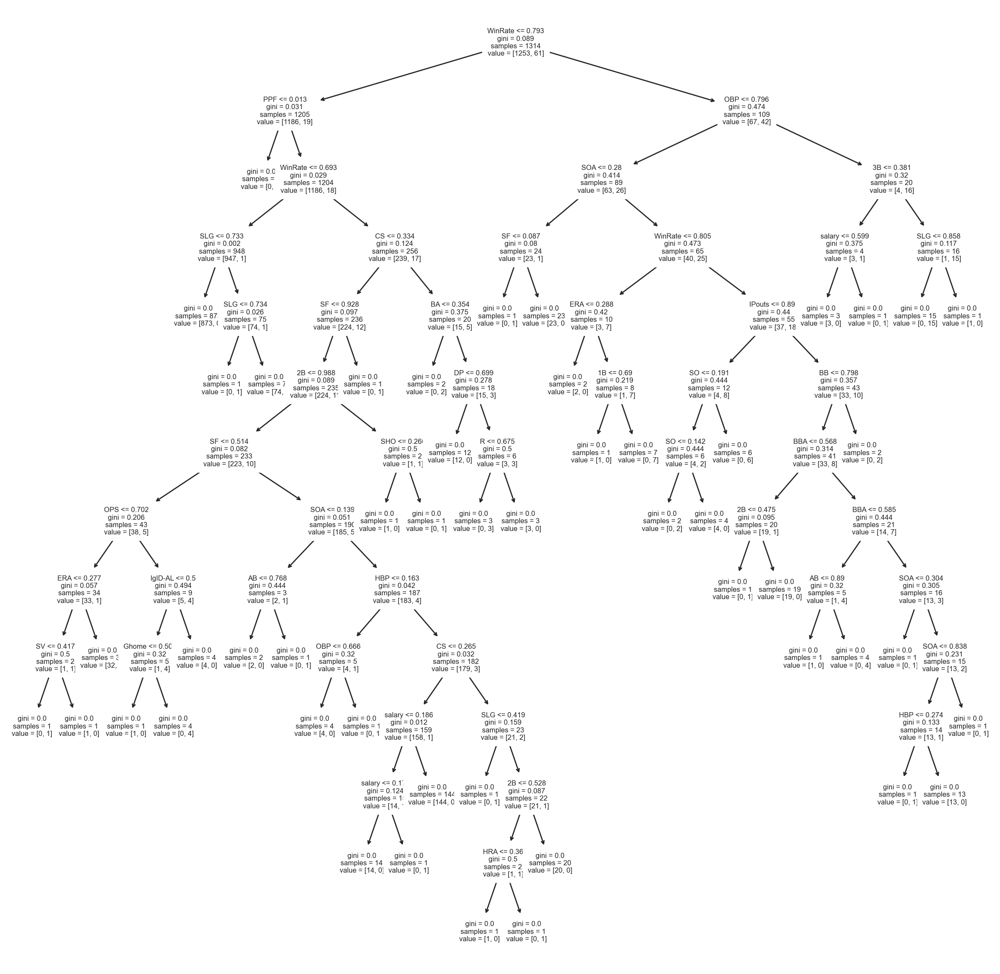

In [39]:
from sklearn.tree import plot_tree

f, axes = plt.subplots(figsize=(15, 15), dpi=196)
plot_tree(model, feature_names=features, ax=axes, fontsize=6)

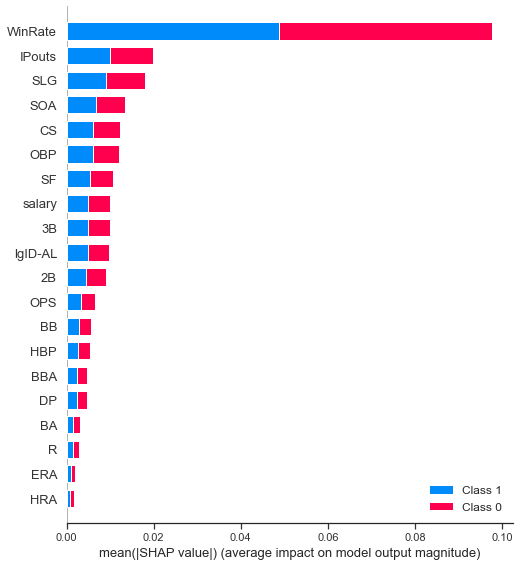

In [40]:
# Plot Feature Relevance for top features
explainer = shap.TreeExplainer(model, X)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X, feature_names=features)

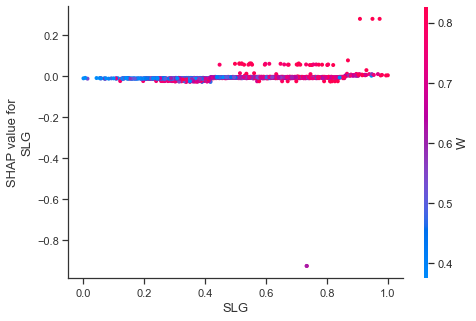

In [41]:
shap.dependence_plot("SLG", shap_values[0], X, interaction_index="W")


In [42]:
# Compute SHAP Interaction Values
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X)

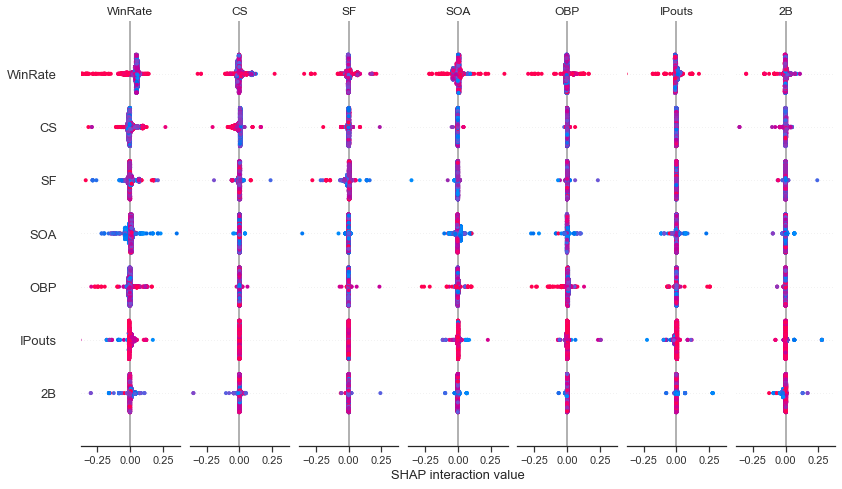

In [43]:
# A summary plot of a SHAP interaction value matrix plots a matrix of summary plots with the main effects on the diagonal and the interaction effects off the diagonal.
shap.summary_plot(shap_interaction_values[0], X)


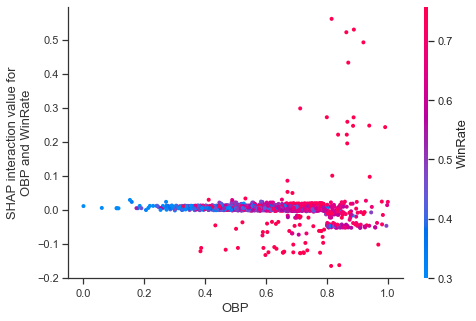

In [44]:
# Running a dependence plot on the SHAP interaction values a allows us to separately observe the main effects and the interaction effects.

shap.dependence_plot(
    ("OBP", "WinRate"),
    shap_interaction_values[1], X
)

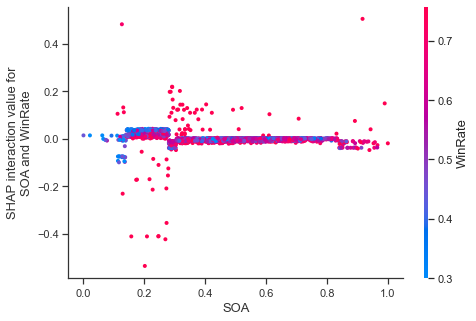

In [45]:
# Running a dependence plot on the SHAP interaction values a allows us to separately observe the main effects and the interaction effects.

shap.dependence_plot(
    ("SOA", "WinRate"),
    shap_interaction_values[1], X
)

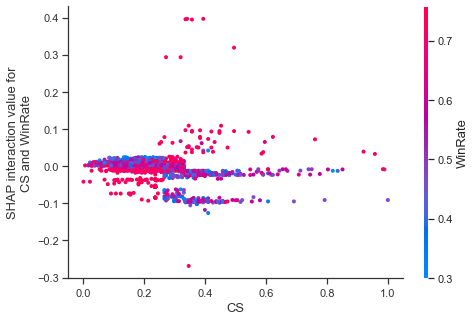

In [46]:
shap.dependence_plot(
    ("CS", "WinRate"),
    shap_interaction_values[1], X
)